In [29]:
import deepxde as dde

import numpy as np
import matplotlib.pyplot as plt

In [30]:
def pde(x, y):
    dy_xx = dde.grad.hessian(y, x, i=0, j=0)
    dy_yy = dde.grad.hessian(y, x, i=1, j=1)
    return -dy_xx - dy_yy - 1

In [31]:
def boundary(_, on_boundary):
    return on_boundary

In [32]:
polygon = [[0, 0], [1, 0], [1, -1], [-1, -1], [-1, 1], [0, 1]]

In [33]:
geom = dde.geometry.Polygon(polygon)
bc = dde.DirichletBC(geom, lambda x: 0, boundary)

In [34]:
data = dde.data.PDE(geom, pde, bc, num_domain=1200, num_boundary=120, num_test=1500)
net = dde.maps.FNN([2] + [50] * 4 + [1], "tanh", "Glorot uniform")
model = dde.Model(data, net)

In [46]:
fixed_polygon = np.asarray(polygon + [polygon[0]])

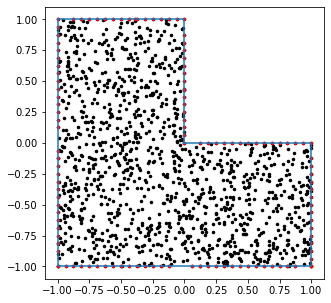

In [84]:
fig, ax = plt.subplots(figsize=(5,5))

ax.plot(np.asarray(fixed_polygon)[:,0],np.asarray(fixed_polygon)[:,1])

plt.scatter(data.train_x_all[:,0],data.train_x_all[:,1],c='k',s=50,marker='.',linewidths=0)

plt.scatter(data.bc_points()[:,0],data.bc_points()[:,1],c='r',s=50,marker='.',linewidths=0)

In [21]:
data.train_points().shape

(1320, 2)

In [85]:
model.compile("adam", lr=0.001)
model.train(epochs=50000)
model.compile("L-BFGS-B")
losshistory, train_state = model.train()

Compiling model...
Building feed-forward neural network...
'build' took 0.122462 s

C:\Users\nilso\Anaconda3\lib\site-packages\tensorflow\python\keras\legacy_tf_layers\core.py:171: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  warnings.warn('`tf.layers.dense` is deprecated and '
C:\Users\nilso\Anaconda3\lib\site-packages\tensorflow\python\keras\engine\base_layer_v1.py:1719: UserWarning: `layer.apply` is deprecated and will be removed in a future version. Please use `layer.__call__` method instead.
  warnings.warn('`layer.apply` is deprecated and '
'compile' took 2.080345 s

Initializing variables...
Training model...

Step      Train loss              Test loss               Test metric
0         [9.09e-01, 6.83e-02]    [9.05e-01, 0.00e+00]    []  
1000      [2.76e-04, 3.30e-03]    [2.26e-04, 0.00e+00]    []  
2000      [1.83e-04, 2.84e-03]    [1.35e-04, 0.00e+00]    []  
3000      [2.92e-04, 2.19e-03

In [87]:
losshistory

Saving loss history to loss.dat ...
Saving training data to train.dat ...
Saving test data to test.dat ...


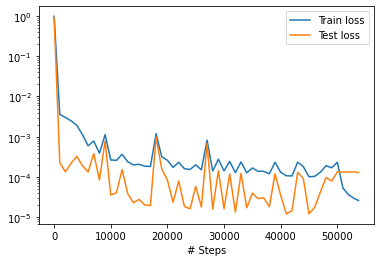

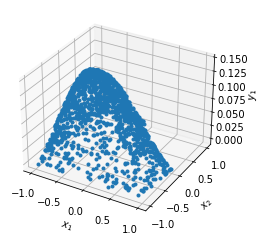

In [86]:
dde.saveplot(losshistory, train_state, issave=True, isplot=True)

In [110]:
x_test = data.test_points()[:,0]
y_test = data.test_points()[:,1]

In [117]:
x_preds = model.predict(data.test_points())

Predicting...
'predict' took 0.001966 s



In [123]:
data_test = np.genfromtxt('test.dat')

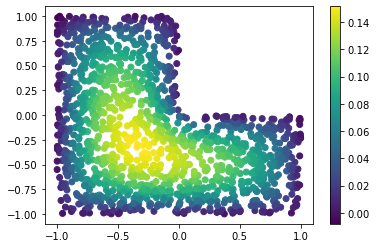

In [129]:
fig = plt.scatter(data_test[:,0],data_test[:,1],c=data_test[:,2])
plt.colorbar(fig)

Predicting...
'predict' took 0.003000 s



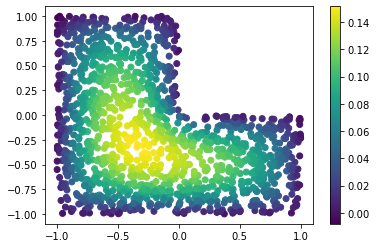

In [130]:
fig = plt.scatter(data_test[:,0],data_test[:,1],c=model.predict(data_test[:,:2]))
plt.colorbar(fig)

In [144]:
model.predict(data_test[:,:2],operator=pde)

Predicting...
'predict' took 0.120998 s



array([[-0.00207607],
       [-0.00157994],
       [-0.00026935],
       ...,
       [ 0.00019366],
       [ 0.00012672],
       [-0.00047025]], dtype=float32)

Predicting...
'predict' took 0.109992 s



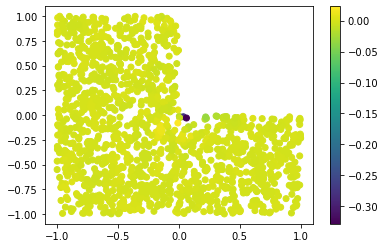

In [145]:
fig = plt.scatter(data_test[:,0],data_test[:,1],c=model.predict(data_test[:,:2],operator=pde))
plt.colorbar(fig)

In [170]:
data_poisson = np.load('Poisson_Lshape.npz')

In [171]:
data_poisson['y_ref'].shape

(25921, 1)

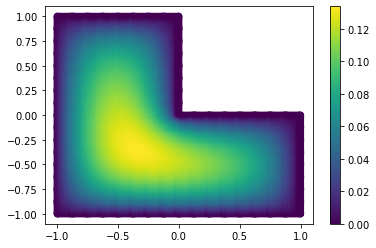

In [177]:
fig = plt.scatter(data_poisson['X_test'][:,0],data_poisson['X_test'][:,1],c=data_poisson['y_ref'])
plt.colorbar(fig)

In [189]:
mask = (data_poisson['X_test'][:,0] > 0)&(data_poisson['X_test'][:,1] > 0)

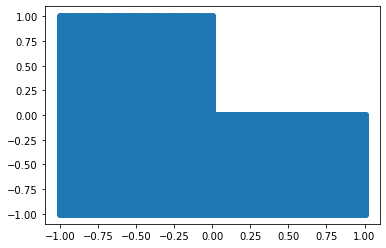

In [190]:
plt.scatter(data_poisson['X_test'][~mask,0],data_poisson['X_test'][~mask,1])

Predicting...
'predict' took 0.016003 s



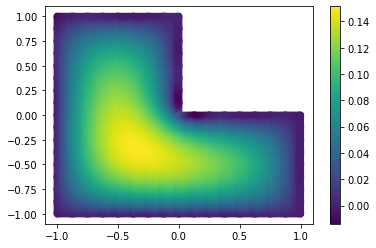

In [191]:
fig = plt.scatter(data_poisson['X_test'][~mask,0],data_poisson['X_test'][~mask,1],c=model.predict(data_poisson['X_test'][~mask]))
plt.colorbar(fig)

Predicting...
'predict' took 0.020023 s



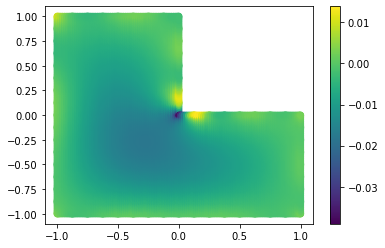

In [192]:
fig = plt.scatter(data_poisson['X_test'][~mask,0],data_poisson['X_test'][~mask,1],c=data_poisson['y_ref'][~mask] - model.predict(data_poisson['X_test'])[~mask])
plt.colorbar(fig)